In [203]:
# import libraries
import pandas as pd
import geopandas as gpd 
import json
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import contextily as ctx
from shapely.geometry import LineString
import os
import csv

## Cargar datos

In [204]:
# Variables globales
nrows = 10
# Ruta del archivo CSV
filename = 'C:/Users/Álvaro/Documents/GitHub/TFG/TFG_TRACLUS/app/train_data/taxis_trajectory/train.csv'

In [205]:
# Leer el archivo CSV
df = pd.read_csv(filename, nrows=nrows, sep=",", low_memory=False)

In [206]:
# Convertir las polilíneas de JSON a listas de coordenadas
df['POLYLINE'] = df['POLYLINE'].apply(lambda x: json.loads(x) if pd.notnull(x) else None)

# Filtrar filas con polilíneas vacías o nulas
df = df[df['POLYLINE'].apply(lambda x: x is not None and len(x) > 0)]

In [207]:
# Preparar las trayectorias para TRACLUS
trayectorias = [np.array(polyline) for polyline in df['POLYLINE']]

## Antres de la optimizacion datos taxis

100 filas de datos son 2 minutos y 45 segundos,
200 filas de datos son 10 minutos y 15 segundos,
300 filas de datos son 33 minutos y 4 segundos,
400 filas de datos son 40 minutos y 1 segundo,
500 filas de datos son 1 hora y 4 minutos,

## TRACLUS

In [208]:
# import importlib
import TRACLUS_OPTIMIZADO  as tr
# importlib.reload(tr)

In [209]:
out = tr.traclus(trayectorias, min_samples=5)

Tiempo angular:  0.11018133163452148


Tiempo perpendicular:  0.7011318206787109
Tiempo paralelo:  0.7055220603942871


In [210]:
""" #from sklearn.cluster import HDBSCAN  clustering_algorithm=HDBSCAN
    
# Ejecutar TRACLUS
out1 = tr.traclus(trayectorias, min_samples=5) """

' #from sklearn.cluster import HDBSCAN  clustering_algorithm=HDBSCAN\n    \n# Ejecutar TRACLUS\nout1 = tr.traclus(trayectorias, min_samples=5) '

In [211]:
partitions, segments, dist_matrix, clusters, cluster_assignments, representative_trajectories = out

In [212]:
save_path = 'C:/Users/Álvaro/Documents/GitHub/TFG/TFG_TRACLUS/app/src/Pruebas dataframe/Dataframe/taxis 10 datos/' 

## Mapas

In [213]:
counter1 = 0
cluster_trayectories = []
# Representacion de las trayectorias pero sin el primer elemento, este parece ser solo un conjunto basura
representative_clusters = representative_trajectories[1:representative_trajectories.__len__()]

# Trayectorias de los clusters en una lista pero sin el primer elemento
for segment in clusters:
    if counter1 == 0:
        counter1 += 1
        continue
    else:
        counter1 += 1
    for part in segment:
        if isinstance(part, np.ndarray):    
            cluster_trayectories.append(part)

In [214]:
""" trayectorias """

' trayectorias '

In [215]:
""" print("Particiones: ", partitions) """

' print("Particiones: ", partitions) '

In [216]:
""" print("Segmentos: ", segments) """

' print("Segmentos: ", segments) '

In [217]:
""" print("Matriz de distancias: ", dist_matrix) """

' print("Matriz de distancias: ", dist_matrix) '

In [218]:
""" print("Clusters: ", clusters) """

' print("Clusters: ", clusters) '

In [219]:
""" print("Asignaciones: ", cluster_assignments) """

' print("Asignaciones: ", cluster_assignments) '

In [220]:
""" print("Trayectorias representativas: ", representative_trajectories) """

' print("Trayectorias representativas: ", representative_trajectories) '

In [221]:
def plot_segments_on_map(segments, cluster_assignments, descart_minun_one=False, leyenda=False, save_path=None):
    # Crear un GeoDataFrame vacío
    gdf = gpd.GeoDataFrame(columns=['geometry', 'cluster_id'])

    # Añadir cada segmento al GeoDataFrame
    for segment, cluster_id in zip(segments , cluster_assignments):
        if descart_minun_one and cluster_id == -1:
            continue
            # Cada 'part' es un segmento dentro del cluster
        if isinstance(segment, np.ndarray):  # Verificar si 'part' es un array de NumPy
            line = LineString(segment)
            gdf = pd.concat([gdf, gpd.GeoDataFrame({'geometry': [line], 'cluster_id': [cluster_id]})], ignore_index=True)

    gdf.crs = "EPSG:4326"
    fig, ax = plt.subplots(figsize=(10, 10), dpi=300)

    if not gdf.empty:
        # Generar colores para cada cluster
        unique_clusters = gdf['cluster_id'].unique()
        colormap = plt.cm.tab20
        color_dict = {cid: colormap(i / len(unique_clusters)) for i, cid in enumerate(unique_clusters)}

        # Dibujar cada segmento según su cluster_id
        for _, row in gdf.iterrows():
            color = color_dict[row['cluster_id']]
            gdf.loc[gdf.index == _, 'geometry'].plot(ax=ax, linewidth=2, color=color)

        # Añadir leyenda
        if leyenda:    
            legend_elements = [Line2D([0], [0], color=color_dict[cid], lw=2, label=f'Cluster {cid}') for cid in unique_clusters]
            ax.legend(handles=legend_elements, loc='upper left')

        ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=gdf.crs.to_string())
    else:
        print("No hay datos válidos para graficar.")

    ax.set_axis_off()

    if save_path is not None:
        directory = os.path.dirname(save_path)
        os.makedirs(directory, exist_ok=True)
        plt.savefig(save_path, bbox_inches='tight', pad_inches=0.1)

    plt.show()

In [222]:
def plot_clusters_on_map(clusters, descart_minun_one=False, leyenda=False, save_path=None):
    # Crear un GeoDataFrame vacío
    gdf = gpd.GeoDataFrame(columns=['geometry', 'cluster_id'])

    cluster_id = 0
    # Añadir cada segmento al GeoDataFrame
    for segment in clusters:
        if descart_minun_one and cluster_id == 0:
            cluster_id +=1
            continue
        else:
            cluster_id +=1
        for part in segment:
            # Cada 'part' es un segmento dentro del cluster
            if isinstance(part, np.ndarray):  # Verificar si 'part' es un array de NumPy
                line = LineString(part)
                gdf = pd.concat([gdf, gpd.GeoDataFrame({'geometry': [line], 'cluster_id': [cluster_id]})], ignore_index=True)

    gdf.crs = "EPSG:4326"
    fig, ax = plt.subplots(figsize=(10, 10), dpi=300)

    if not gdf.empty:
        # Generar colores para cada cluster
        unique_clusters = gdf['cluster_id'].unique()
        colormap = plt.cm.tab20
        color_dict = {cid: colormap(i / len(unique_clusters)) for i, cid in enumerate(unique_clusters)}

        # Dibujar cada segmento según su cluster_id
        for _, row in gdf.iterrows():
            color = color_dict[row['cluster_id']]
            gdf.loc[gdf.index == _, 'geometry'].plot(ax=ax, linewidth=2, color=color)

        # Añadir leyenda   
        if leyenda:     
            legend_elements = [Line2D([0], [0], color=color_dict[cid], lw=2, label=f'Cluster {cid}') for cid in unique_clusters]
            ax.legend(handles=legend_elements, loc='upper left')
        
        ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=gdf.crs.to_string())
    else:
        print("No hay datos válidos para graficar.")

    ax.set_axis_off()

    if save_path is not None:
        directory = os.path.dirname(save_path)
        os.makedirs(directory, exist_ok=True)
        plt.savefig(save_path, bbox_inches='tight', pad_inches=0.1)

    plt.show()

In [223]:
def create_gdf(data):
    valid_geometries = [LineString(x) for x in data if len(x) > 1]
    gdf = gpd.GeoDataFrame(geometry=valid_geometries, crs='EPSG:4326')

    return gdf

In [224]:
def plot_map(data, color, data2=None, color2=None, save_path=None):
    # Crear GeoDataFrame
    gdf = create_gdf(data)
    if data2 is not None:
        gdf2 = create_gdf(data2)
    else:
        gdf2 = None

    # Visualizar en un mapa
    fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
    if gdf2 is not None:
        gdf2.plot(ax=ax, color=color2, alpha=0.5, linewidth=1)
    gdf.plot(ax=ax, color=color, linewidth=2)
    
    # Añadir mapa base
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=gdf.crs.to_string())
    # ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)
    ax.set_axis_off()

    if save_path is not None:
        directory = os.path.dirname(save_path)
        os.makedirs(directory, exist_ok=True)
        plt.savefig(save_path, bbox_inches='tight', pad_inches=0.1)

    plt.show()

In [225]:
def plot_map_colour(data, cmap='tab20' ,data2=None, cmap2='tab20', save_path=None):
    # Crear un GeoDataFrame
    gdf = create_gdf(data)
    if data2 is not None:
        gdf2 = create_gdf(data2)
    else:
        gdf2 = None

    # Visualizar en un mapa
    fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
    if gdf2 is not None:
        gdf2.plot(ax=ax, cmap=cmap2, alpha=0.5, linewidth=1)
    gdf.plot(ax=ax, cmap=cmap, linewidth=2)

    # Añadir mapa base
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=gdf.crs.to_string())
    ax.set_axis_off()

    if save_path is not None:
        directory = os.path.dirname(save_path)
        os.makedirs(directory, exist_ok=True)
        plt.savefig(save_path, bbox_inches='tight', pad_inches=0.1)
        
    plt.show()

Visualizar datos en mapas

In [226]:
#plot_map(partitions, 'green')

In [227]:
partitions[0]

array([[-8.618643, 41.141412],
       [-8.622153, 41.143815],
       [-8.627373, 41.144697],
       [-8.631738, 41.148225],
       [-8.629128, 41.15124 ],
       [-8.628759, 41.152518],
       [-8.631144, 41.154489],
       [-8.630829, 41.154498],
       [-8.630838, 41.154489]])

In [228]:
df['POLYLINE'].iloc[0]

[[-8.618643, 41.141412],
 [-8.618499, 41.141376],
 [-8.620326, 41.14251],
 [-8.622153, 41.143815],
 [-8.623953, 41.144373],
 [-8.62668, 41.144778],
 [-8.627373, 41.144697],
 [-8.630226, 41.14521],
 [-8.632746, 41.14692],
 [-8.631738, 41.148225],
 [-8.629938, 41.150385],
 [-8.62911, 41.151213],
 [-8.629128, 41.15124],
 [-8.628786, 41.152203],
 [-8.628687, 41.152374],
 [-8.628759, 41.152518],
 [-8.630838, 41.15268],
 [-8.632323, 41.153022],
 [-8.631144, 41.154489],
 [-8.630829, 41.154507],
 [-8.630829, 41.154516],
 [-8.630829, 41.154498],
 [-8.630838, 41.154489]]

In [229]:
#plot_map(segments, 'purple')

200 filas de datso son 4 minutos y 19 segundos

In [230]:
""" plot_segments_on_map(segments, cluster_assignments, descart_minun_one=True) """

' plot_segments_on_map(segments, cluster_assignments, descart_minun_one=True) '

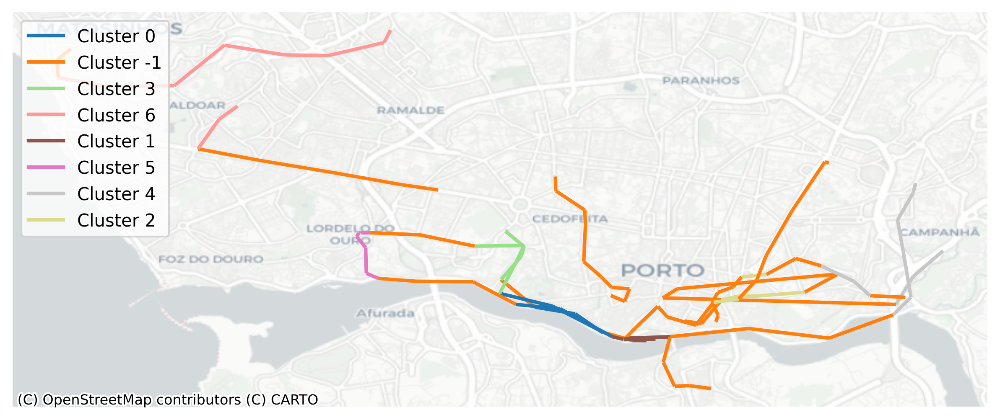

In [231]:
plot_segments_on_map(segments, cluster_assignments, leyenda=True, save_path=save_path + 'clusters_map.png')

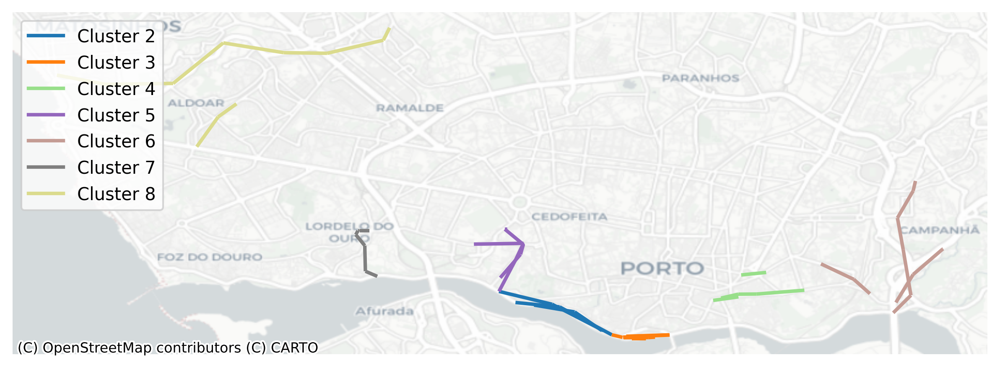

In [232]:
plot_clusters_on_map(clusters, True, True, save_path=save_path + 'clusters_map_without_-1.png')

In [233]:
""" plot_map(representative_trajectories, 'red', df['POLYLINE'], 'blue') """

" plot_map(representative_trajectories, 'red', df['POLYLINE'], 'blue') "

Mostrar cada representacion del cluster con un color diferente

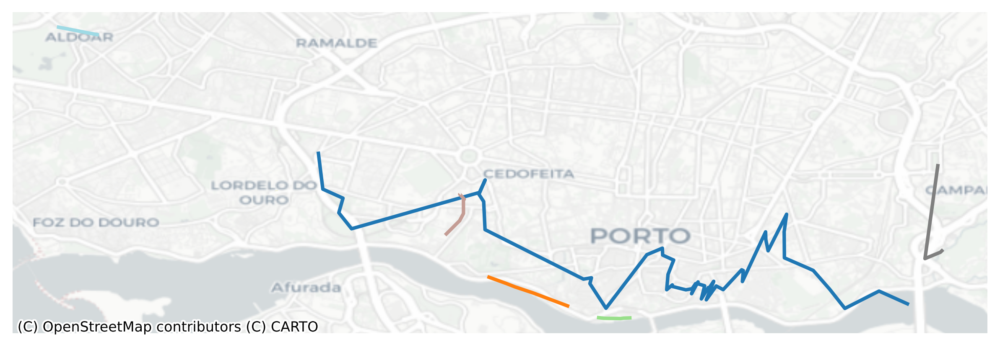

In [234]:
plot_map_colour(representative_trajectories, save_path=save_path + 'representative_trajectories.png')

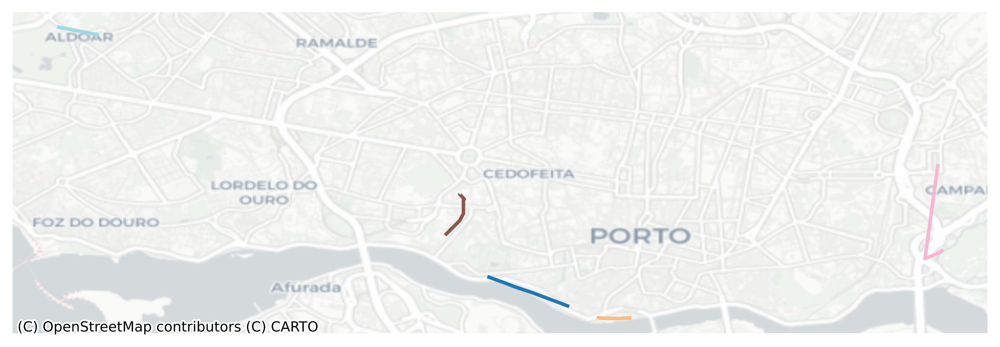

In [235]:
plot_map_colour(representative_clusters, save_path=save_path + 'representative_trayectories_without_-1.png')

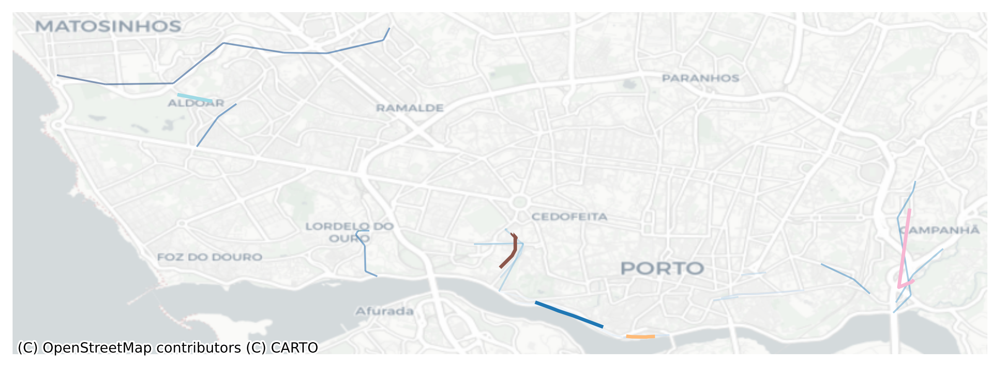

In [236]:
plot_map_colour(representative_clusters, data2=cluster_trayectories, cmap2='Blues', save_path=save_path + 'representative_trayectories_with_clusters.png')

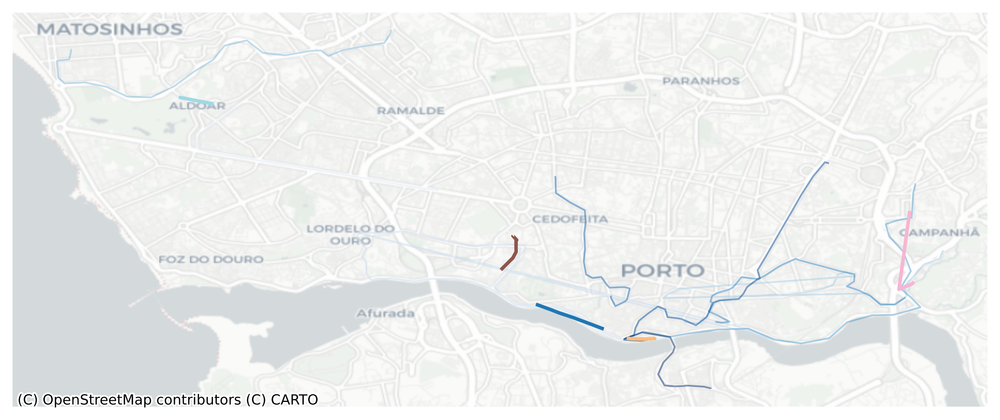

In [237]:
plot_map_colour(representative_clusters, data2=df['POLYLINE'], cmap2='Blues', save_path=save_path + 'representative_trayectories_with_original_trayectories.png')

Implementacion de zoom que se puede usar

In [238]:
""" # Asegurarse de que los límites del eje se ajusten a las geometrías que estás mostrando
xmin, ymin, xmax, ymax = gdf.total_bounds
# Calcular el rango y expandirlo
xrange = xmax - xmin
yrange = ymax - ymin

# Aumentar el rango por un factor (por ejemplo, 20% más grande)
expand_factor = 100
xmin -= xrange * expand_factor
xmax += xrange * expand_factor
ymin -= yrange * expand_factor
ymax += yrange * expand_factor

# Aplicar los nuevos límites
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax) """

' # Asegurarse de que los límites del eje se ajusten a las geometrías que estás mostrando\nxmin, ymin, xmax, ymax = gdf.total_bounds\n# Calcular el rango y expandirlo\nxrange = xmax - xmin\nyrange = ymax - ymin\n\n# Aumentar el rango por un factor (por ejemplo, 20% más grande)\nexpand_factor = 100\nxmin -= xrange * expand_factor\nxmax += xrange * expand_factor\nymin -= yrange * expand_factor\nymax += yrange * expand_factor\n\n# Aplicar los nuevos límites\nax.set_xlim(xmin, xmax)\nax.set_ylim(ymin, ymax) '

## Estadisticas de los datos

partitions,                         # Particiones de trayectorias originales


segments,                           # Segmentos de las trayectorias por cambios significativos de la trayectoria


dist_matrix,                        # Matriz de distancias entre segmentos


clusters,                           # Segmentos de las trayectorias agrupados en clusters, por similitud


cluster_assignments,                # Lista que mustra que segmento pertenece a que cluster


representative_trajectories,        # Trayectorias representativas de cada cluster


representative_clusters,            # Trayectorias representativas de cada cluster pero sin el primer elemento, cluster -1, trayectorias no agrupadas


cluster_trayectories                # Trayectorias de los clusters en una lista pero sin el primer elemento

In [372]:

def plot_table(nombres_columnas, datos, save_path=None):
    # Longitud máxima para cada columna (solo para la impresión en consola)
    longitudes_maximas = [max(len(str(x)) for x in columna) for columna in zip(nombres_columnas, *datos)]

    # Imprimir en consola
    for nombre, longitud in zip(nombres_columnas, longitudes_maximas):
        print(f'{nombre.ljust(longitud)}', end=' ')
    print()
    for fila in datos:
        for elemento, longitud in zip(fila, longitudes_maximas):
            print(f'{str(elemento).ljust(longitud)}', end=' ')
        print()

    # Guardar en un archivo de texto si se proporciona una ruta
    if save_path:
        # Crear el directorio si no existe
        directory = os.path.dirname(save_path)
        if not os.path.exists(directory):
            print(f"Creando el directorio: {directory}")
            os.makedirs(directory, exist_ok=True)

        print(f"Guardando archivo en: {save_path}")  # Imprimir la ruta antes de guardar

        try:
            # Guardar los datos en un archivo de texto
            with open(save_path, mode='w', encoding='utf-8') as file:
                # Escribir los nombres de las columnas
                file.write('\t'.join(nombres_columnas) + '\n')
                # Escribir los datos
                for fila in datos:
                    file.write('\t'.join(map(str, fila)) + '\n')
                print(f'Datos guardados exitosamente en {save_path}')
        except Exception as e:
            print(f'Ocurrió un error al guardar el archivo de texto: {e}')

In [385]:
len_tr = trayectorias.__len__()
len_par = partitions.__len__()
len_seg = segments.__len__()
len_cl = clusters.__len__()

# Lista de nombres de columnas
nombres_columnas = ["", "Trayectorias", "Particiones", "Segmentos", "Clusters"]

# Lista de datos
datos = [
    ["Tamaño:" ,len_tr, len_par, len_seg, len_cl],
    ["Cantidad por trayectoria:", len_tr/len_tr, len_par/len_tr, len_seg/len_tr, len_cl/len_tr],
]

plot_table(nombres_columnas, datos, save_path=save_path + 'table_relaciones.txt')


                          Trayectorias Particiones Segmentos Clusters 
Tamaño:                   10           10          111       8        
Cantidad por trayectoria: 1.0          1.0         11.1      0.8      
Guardando archivo en: C:/Users/Álvaro/Documents/GitHub/TFG/TFG_TRACLUS/app/src/Pruebas dataframe/Dataframe/taxis 10 datos/table_relaciones.csv
Datos guardados exitosamente en C:/Users/Álvaro/Documents/GitHub/TFG/TFG_TRACLUS/app/src/Pruebas dataframe/Dataframe/taxis 10 datos/table_relaciones.csv


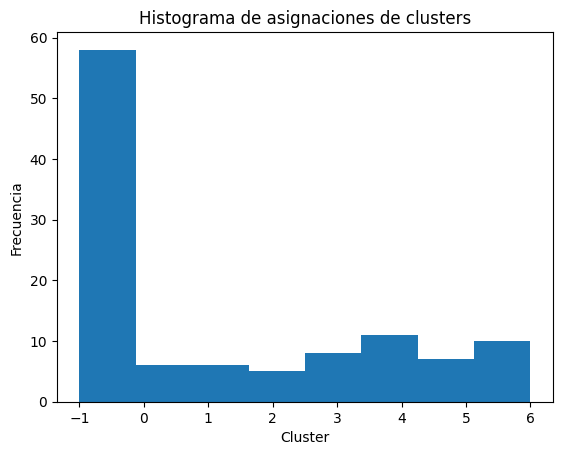

In [386]:
# Crear histograma de asignaciones de clusters
plt.hist(cluster_assignments, bins=len_cl)
plt.title("Histograma de asignaciones de clusters")
plt.xlabel("Cluster")
plt.ylabel("Frecuencia")
plt.show()

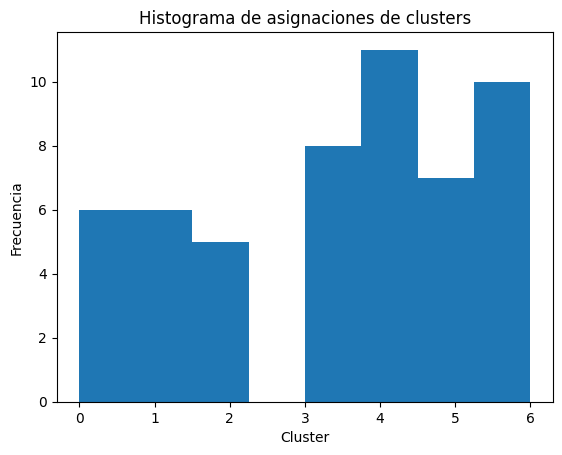

In [387]:
cluster_asig_2 = [asig for asig in cluster_assignments if asig != -1]

# Crear histograma de asignaciones de clusters
plt.hist(cluster_asig_2, bins=len_cl)
plt.title("Histograma de asignaciones de clusters")
plt.xlabel("Cluster")
plt.ylabel("Frecuencia")
plt.show()

In [388]:
# Estadísticas de las asignaciones de clusters
print("Estadísticas de las asignaciones de clusters")

# Lista de nombres de columnas
nombres_columnas = ['Cluster', 'Tamaño', 'Porcentaje']

# Calcular los tamaños de los clusters utilizando np.unique
clusters_unicos, tamaños_clusters = np.unique(cluster_assignments, return_counts=True)

# Calcular el total de asignaciones de clusters
total_asignaciones = len(cluster_assignments)

# Calcular los porcentajes de los tamaños de los clusters y redondear a dos decimales
porcentajes_clusters = np.round((tamaños_clusters / total_asignaciones) * 100, 2)

# Lista de datos
datos = [[cluster, tamaño, porcentaje] for cluster, tamaño, porcentaje in zip(clusters_unicos, tamaños_clusters, porcentajes_clusters)]

plot_table(nombres_columnas, datos, save_path=save_path + 'table_clusters.txt')

Estadísticas de las asignaciones de clusters
Cluster Tamaño Porcentaje 
-1      58     52.25      
0       6      5.41       
1       6      5.41       
2       5      4.5        
3       8      7.21       
4       11     9.91       
5       7      6.31       
6       10     9.01       


El porcentaje de segmentos que pertenecen al custer -1 aumenta segun vallan aumentando las trayectorias

## Creacion de gdf que permite visualizar a que trayectria y cluster pertenece cada segmento

In [417]:
def relational_table(df, segments, cluster_assignments, save_path=None):
    # Temporary list to store data before creating GeoDataFrame
    gdf_stc_data = []
    index = 0

    for segment, cluster_id in zip(segments, cluster_assignments):
        if isinstance(segment, np.ndarray):
            line = LineString(segment)
            tray_id_found = False
            
            for i, polyline in enumerate(df['POLYLINE'][index:len(df['POLYLINE'])]):
                # Check if the polyline has 2 or more points
                if i > 0:
                    index += 1

                if len(polyline) >= 2:
                    tray_line = LineString(polyline)
                    
                    if tray_line.intersects(line):
                        tray_id = index
                        tray_id_found = True
                        break  # Exit the loop once a matching tray_line is found
                else:
                    continue  # Skip this polyline as it cannot form a valid LineString

            if not tray_id_found:
                tray_id = -1  # Indicator for 'not found'

            # Append valid data to the list
            gdf_stc_data.append({'geometry': line, 'cluster_id': cluster_id, 'tray_id': tray_id})

    # Create the GeoDataFrame from the collected data
    gdf_stc = gpd.GeoDataFrame(gdf_stc_data, columns=['geometry', 'cluster_id', 'tray_id'])

    # Guardar en archivo de texto si se proporciona una ruta
    if save_path:
        # Crear el directorio si no existe
        directory = os.path.dirname(save_path)
        if not os.path.exists(directory):
            print(f"Creando el directorio: {directory}")
            os.makedirs(directory, exist_ok=True)

        # Guardar en formato TXT
        txt_path = save_path + '.txt'
        try:
            with open(txt_path, mode='w', encoding='utf-8') as file:
                # Escribir encabezados
                file.write("geometry\tcluster_id\ttray_id\n")
                # Escribir datos
                for _, row in gdf_stc.iterrows():
                    file.write(f"{row['geometry']}\t{row['cluster_id']}\t{row['tray_id']}\n")
            print(f"Datos guardados exitosamente en {txt_path}")
        except Exception as e:
            print(f"Ocurrió un error al guardar el archivo TXT: {e}")

    return gdf_stc

In [418]:
gdf_stc = relational_table(df, segments, cluster_assignments, save_path=save_path + 'table_clusters_trayectorias')
gdf_stc

Datos guardados exitosamente en C:/Users/Álvaro/Documents/GitHub/TFG/TFG_TRACLUS/app/src/Pruebas dataframe/Dataframe/taxis 10 datos/table_clusters_trayectorias.txt


,geometry,cluster_id,tray_id
0,"LINESTRING (-8.61864 41.14141, -8.62215 41.14381)",0,0
1,"LINESTRING (-8.62215 41.14381, -8.62737 41.14470)",0,0
2,"LINESTRING (-8.62737 41.14470, -8.63174 41.14822)",-1,0
3,"LINESTRING (-8.63174 41.14822, -8.62913 41.15124)",3,0
4,"LINESTRING (-8.62913 41.15124, -8.62876 41.15252)",3,0
...,...,...,...
106,"LINESTRING (-8.60990 41.14083, -8.61078 41.13755)",-1,9
107,"LINESTRING (-8.61078 41.13755, -8.60932 41.13445)",-1,9
108,"LINESTRING (-8.60932 41.13445, -8.60799 41.13452)",-1,9
109,"LINESTRING (-8.60799 41.13452, -8.60741 41.13453)",-1,9


In [419]:
# Segmetos que forma la trayectotia x
gdf_stc.loc[gdf_stc['tray_id'] == 99]    

,geometry,cluster_id,tray_id


In [420]:
# Trayectorias que forman el cluster y
y = 1
cluster_y = gdf_stc[gdf_stc['cluster_id'] == y]
print(cluster_y)

                                              geometry  cluster_id  tray_id
14   LINESTRING (-8.61296 41.14036, -8.61477 41.14037)           1        2
35   LINESTRING (-8.61736 41.14086, -8.61597 41.14053)           1        2
60   LINESTRING (-8.61550 41.14067, -8.60998 41.14085)           1        5
92   LINESTRING (-8.61179 41.14056, -8.61262 41.14050)           1        8
93   LINESTRING (-8.61262 41.14050, -8.61584 41.14048)           1        8
105  LINESTRING (-8.61591 41.14056, -8.60990 41.14083)           1        8


## Visualizacion de las trayectorias con sus segmentos por separado

In [421]:
trayectoria_para_visualizar = 0

gdf_stc_fragment = gdf_stc[gdf_stc['tray_id'] == trayectoria_para_visualizar]
gdf_stc_fragment

,geometry,cluster_id,tray_id
0,"LINESTRING (-8.61864 41.14141, -8.62215 41.14381)",0,0
1,"LINESTRING (-8.62215 41.14381, -8.62737 41.14470)",0,0
2,"LINESTRING (-8.62737 41.14470, -8.63174 41.14822)",-1,0
3,"LINESTRING (-8.63174 41.14822, -8.62913 41.15124)",3,0
4,"LINESTRING (-8.62913 41.15124, -8.62876 41.15252)",3,0
5,"LINESTRING (-8.62876 41.15252, -8.63114 41.15449)",3,0
6,"LINESTRING (-8.63114 41.15449, -8.63083 41.15450)",3,0
7,"LINESTRING (-8.63083 41.15450, -8.63084 41.15449)",3,0


In [422]:
lista_de_listas = gdf_stc_fragment.apply(lambda row: [list(row['geometry'].coords)], axis=1).tolist()
lista_ = []

for lista in lista_de_listas:
    lista_.append(lista[0])

# lista_

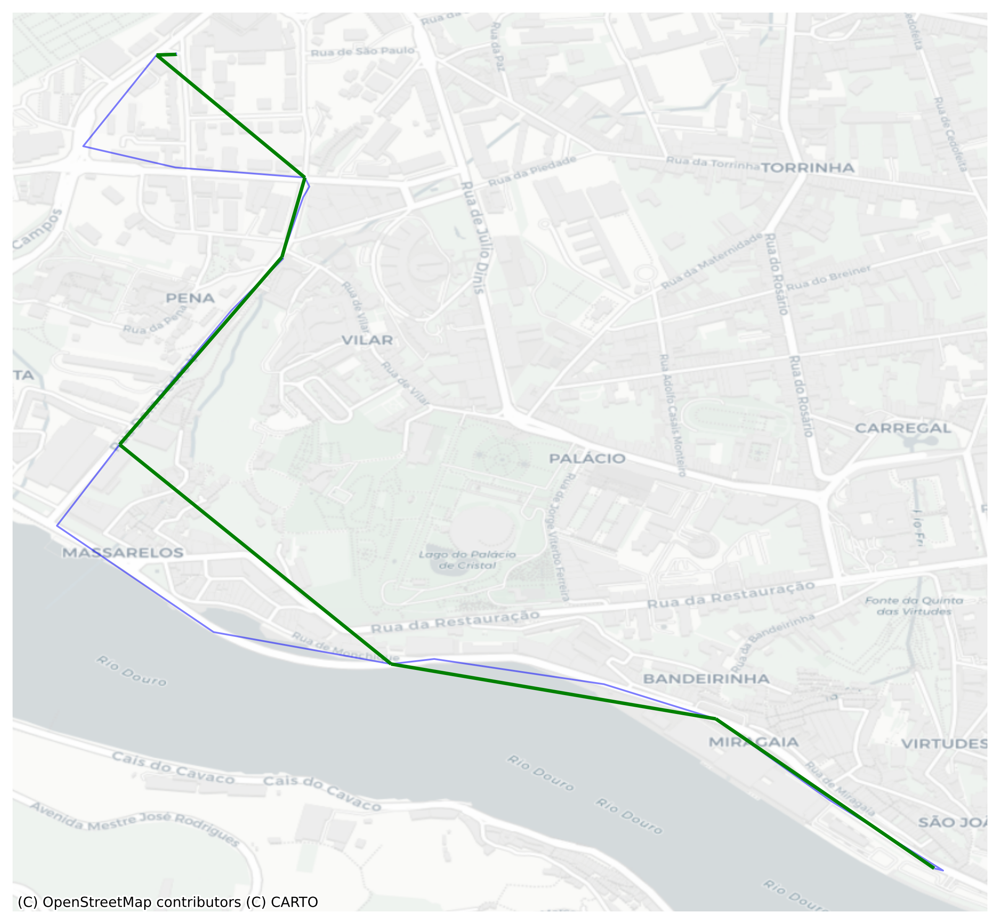

In [423]:
plot_map(lista_, 'green', df['POLYLINE'][trayectoria_para_visualizar:trayectoria_para_visualizar+1], 'blue', save_path=save_path + 'trayectoria_0_cluster_1.png')

In [424]:
# Tareas
"""
1. Cambiar la forma usar el TRACLUS en este fichero (Completada)
2. Buscar una forma adecurada de guardar los datos (Completada)
3. Comprovar sklearn
4. Buscar nuevos data frames
5. Comprovar que los dataframes se cargan y calculan correctamente
6. Proceder con el analisis de todos los dataframes
"""

'\n1. Cambiar la forma usar el TRACLUS en este fichero (Completada)\n2. Buscar una forma adecurada de guardar los datos\n3. Comprovar sklearn\n4. Buscar nuevos data frames\n5. Comprovar que los dataframes se cargan y calculan correctamente\n6. Proceder con el analisis de todos los dataframes\n'